In [9]:
from fastai.vision.all import *
import os

bears = DataBlock(
    blocks= (ImageBlock, CategoryBlock),
    get_items =get_image_files,
    splitter = RandomSplitter(valid_pct=0.2, seed= 42),
    get_y = parent_label,
    item_tfms=Resize(128)
)


Create a search images funciton to search for images based on a term, using duck duck go search

In [5]:
from time import sleep
import os
from typing import List


from duckduckgo_search import DDGS
ddg_images = DDGS
from fastcore.all import *

def search_images(term, max_images=200): 
    images = None
    with ddg_images() as ddgs:
        keywords = term
        ddgs_images_gen = ddgs.images(
          keywords,
          region = "wt-wt",
          safesearch = "moderate",
          max_results=max_images,
        )
        images = list(ddgs_images_gen)
  
    
    return L(images).itemgot('image')

def download_searches(searches: List[str], tags: List[str], path = os.getcwd()):
    """
    Download images based on a list of searches and tags.
    
    Args:
        searches (List[str]): A list of search terms.
        tags (List[str]): A list of tags to be appended to the search terms.
        basepath (str, optional): The base path where the images will be saved. Defaults to the current working directory.
    """
    
    for search in searches:
        dest = (path/search) #set the destination as 
        dest.mkdir(exist_ok=True, parents=True)
        for tag in tags:
            download_images(dest, urls=search_images(f'{search} {tag}')) #here we call the search images function defined above
            sleep(10)  # Pause between searches to avoid over-loading server
        resize_images(path/tag, max_size=400, dest=path/tag)

def verify_searches(path):
    failed = verify_images(get_image_files(path))
    failed.map(Path.unlink)
    print(len(failed))
    

Perform the search and organise the data into respective folders that will be useful for labelling the data in the `DataBlock` class

In [15]:
srchs = ["zaha hadid architecture", "norman foster architecture", "thomas heatherwick architecture", "bjarke engles architecture"]
tags = ["buildings", "interiors", "photos"]
path = Path(r"C:\Users\jossi\Dropbox\Studies\FastAI\course22\Chapter_2_Homework")
# download_searches(searches=srchs, tags=tags, path=path)
# verify_searches(path)

Load the data by first creating a DataBlock object - here, we specify 4 key components: 
- what type of data we are loading - in the blocks parameter
- we fetch all the image files using a fastai function
- we split a training and testing set using 80/20. 
- we specify a function to determine the labels
- and finally use a transformer to ensure all the data is consistent


In [16]:
designers = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.2, seed = 42),
    get_y = parent_label,
    item_tfms=Resize(128)
)
dls = designers.dataloaders(path)

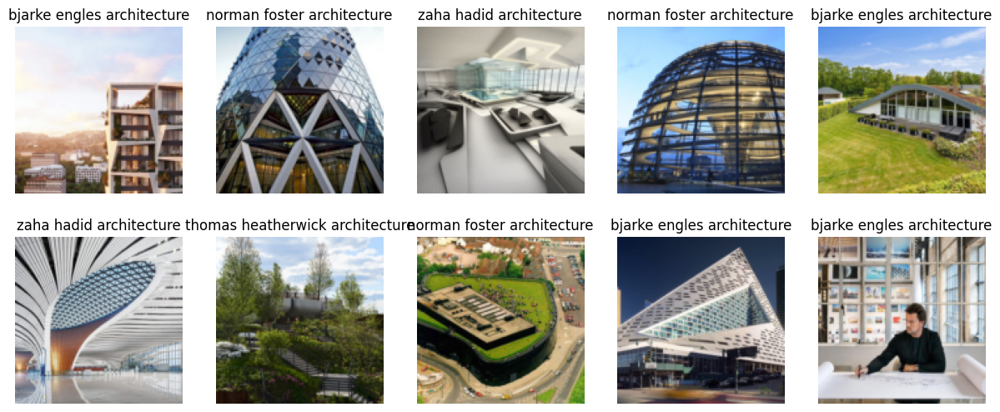

In [17]:
dls.show_batch(max_n=10, nrows=2)

We now have the training and validation sets, time to start training the model. To do so, we need to create a CNN learner object.

In [19]:
learn = cnn_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(4)


epoch,train_loss,valid_loss,error_rate,time
0,1.601732,0.801984,0.264901,01:14


epoch,train_loss,valid_loss,error_rate,time
0,0.803823,0.516854,0.163355,01:14
1,0.544311,0.474032,0.116998,01:13
2,0.362442,0.408594,0.099338,01:14
3,0.251148,0.410527,0.099338,01:14


Check the results

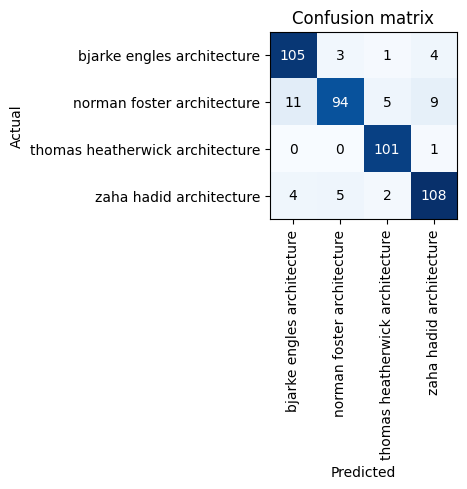

In [20]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Looks like the styles of BIG and F&P are most closely aligned as they are the hardest to distinguish from each other. Lets now check which predictions were most wrong. Most wrong being having the higest percentage of a false positive of true negative, meaning there was a high degree of erroneous confidence 

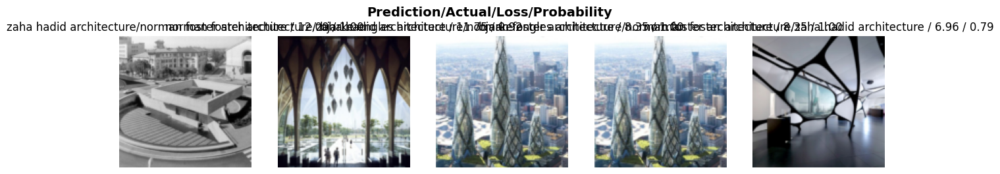

In [21]:
interp.plot_top_losses(5, nrows=1)

In [24]:
from fastai.vision.widgets import ImageClassifierCleaner
cleaner = ImageClassifierCleaner(learn)

Now run through all the categorical data that might be causing errors. The cleaner object allows us to visually verify the test sets because the images are ordered according to their loss (highest to lowest). Here, we can delete, change label of and check each category

In [25]:
cleaner 

now run the following cell below to remove the items from the sets

In [26]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

to move images can perform this:

In [27]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Now see the results in action


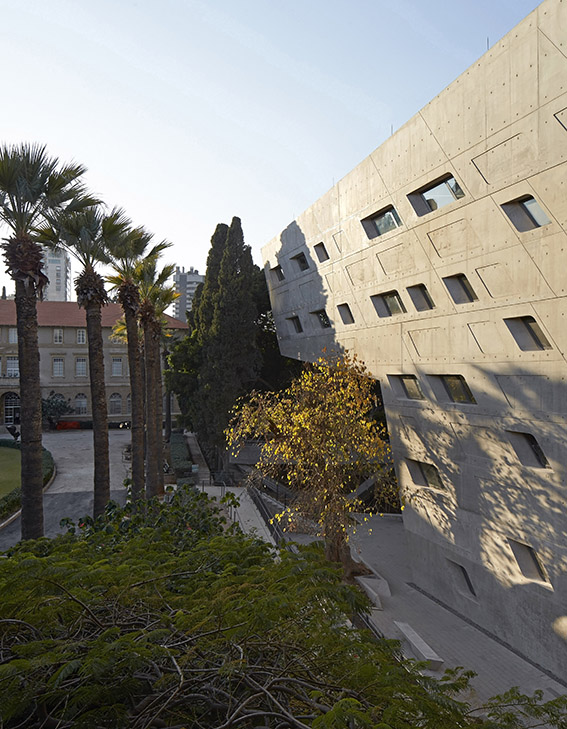

Pred: norman foster architecture.
Actual: zahahadid.jpg
Probability it's zahahadid.jpg: 0.1401


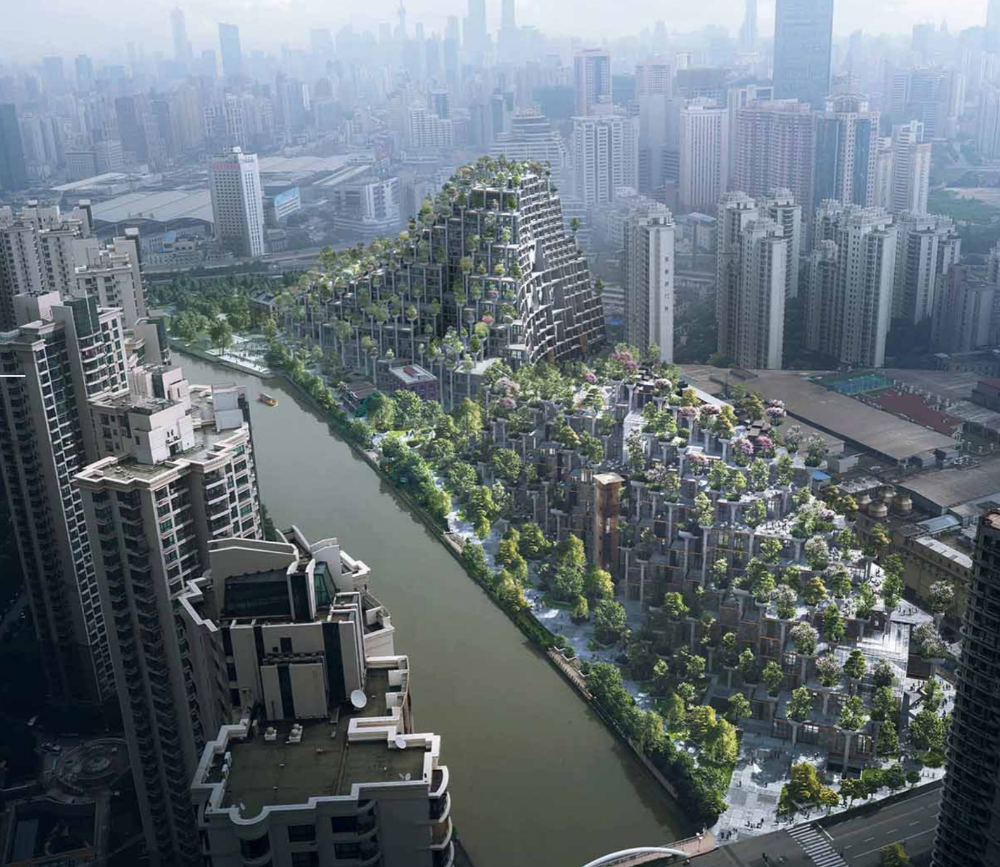

Pred: bjarke engles architecture.
Actual: hw1.jpeg
Probability it's hw1.jpeg: 1.0000


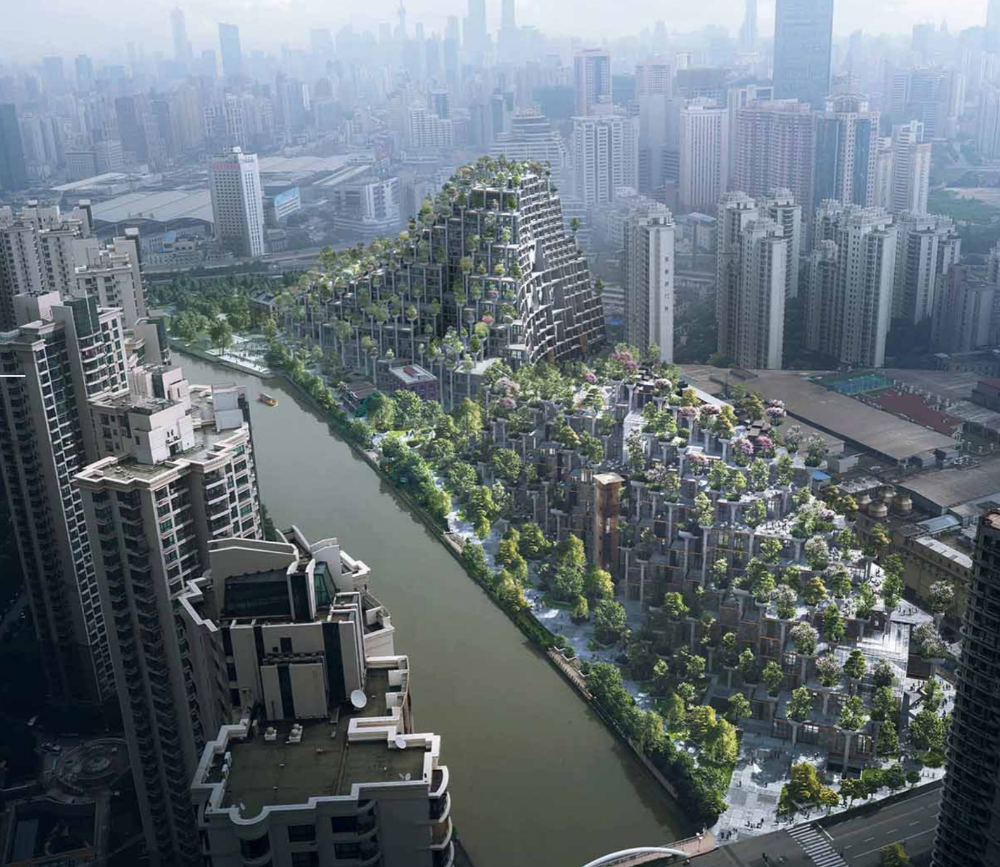

Pred: bjarke engles architecture.
Actual: hw1.jpeg
Probability it's hw1.jpeg: 1.0000


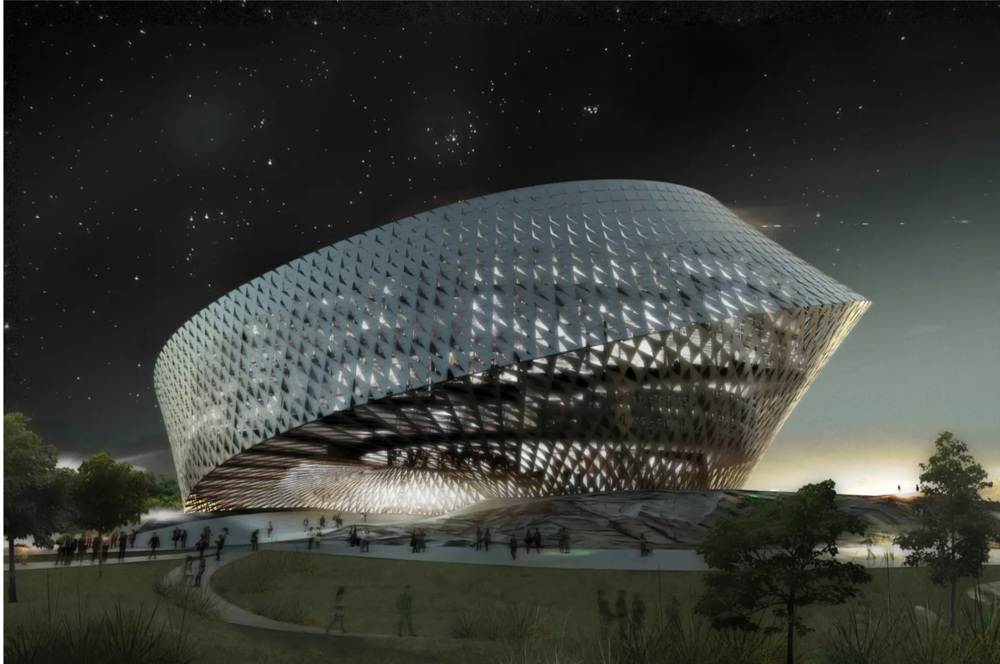

Pred: bjarke engles architecture.
Actual: bi1.jpeg
Probability it's bi1.jpeg: 0.8124


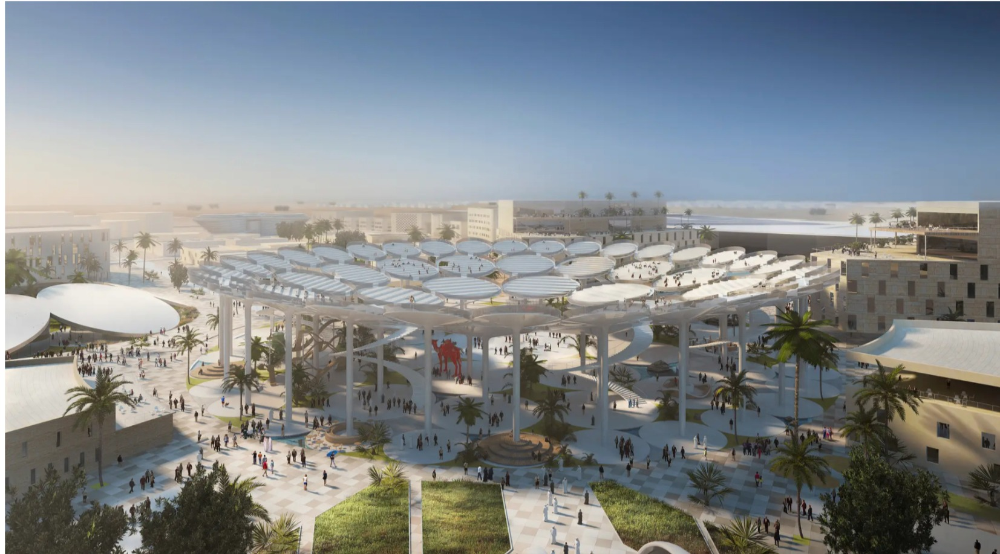

Pred: bjarke engles architecture.
Actual: bi2.jpeg
Probability it's bi2.jpeg: 0.9994


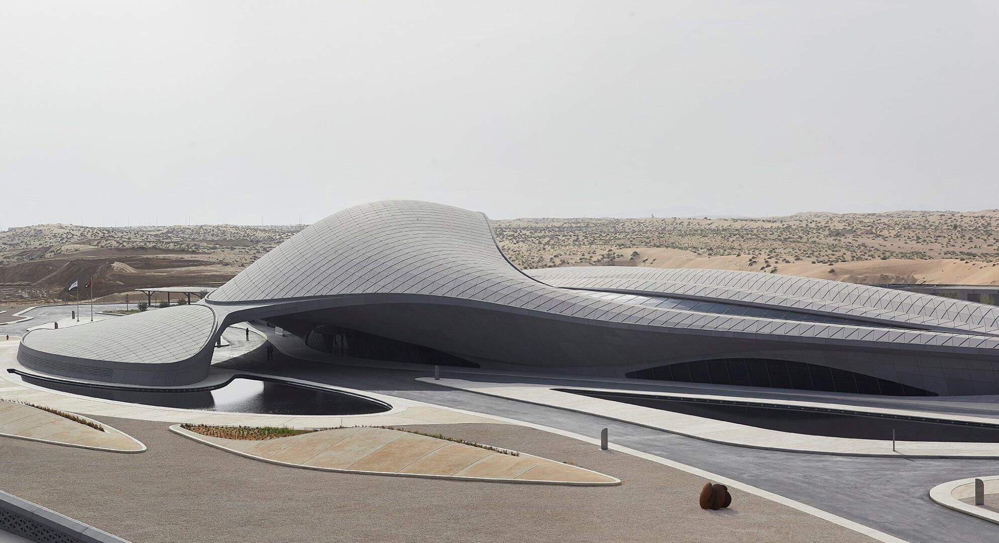

Pred: zaha hadid architecture.
Actual: zha.jpg
Probability it's zha.jpg: 0.0003


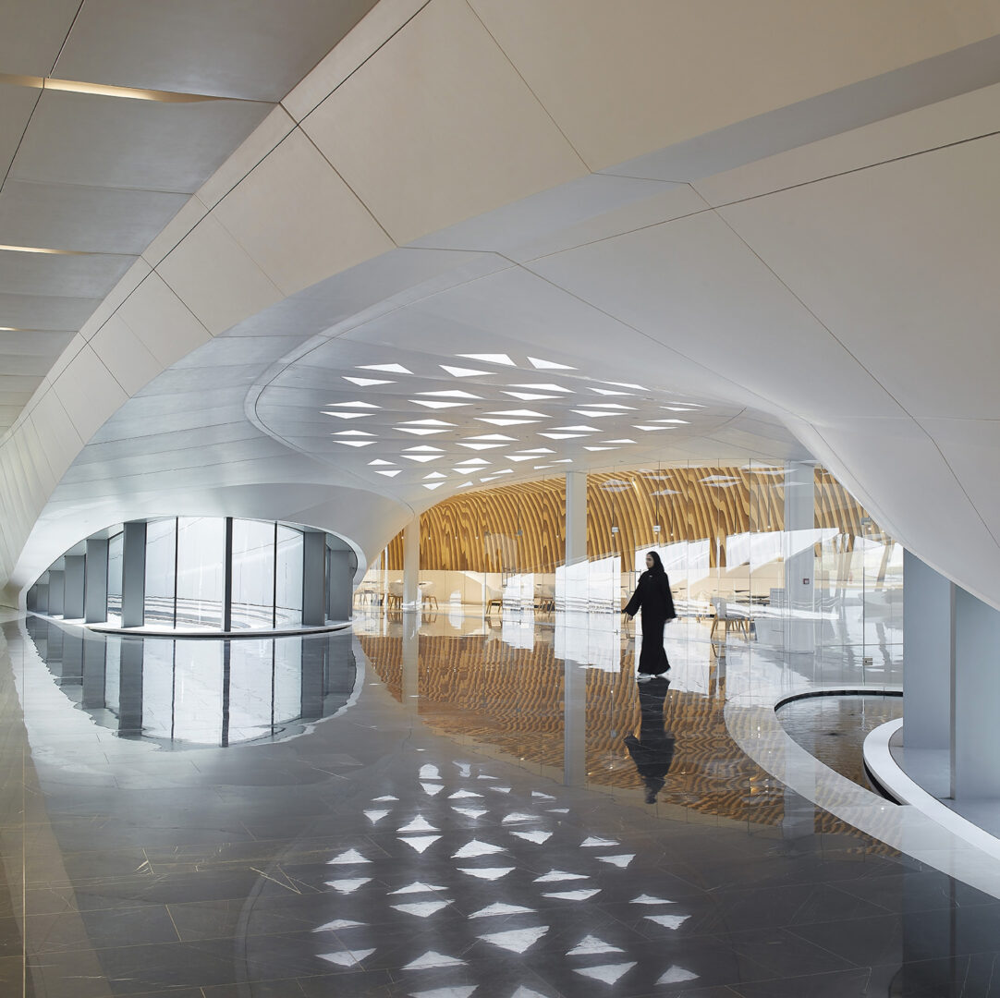

Pred: zaha hadid architecture.
Actual: zha2.jpg
Probability it's zha2.jpg: 0.0014


In [39]:

test_files = ["zahahadid.jpg", "hw1.jpeg", "hw1.jpeg", "bi1.jpeg", "bi2.jpeg", "zha.jpg", "zha2.jpg"]
for file in test_files:
    zha1 = PILImage.create(file)
    is_zha,_,probs = learn.predict(zha1)
    display(zha1)
    print(f"Pred: {is_zha}.")
    print(f"Actual: {file}")
    print(f"Probability it's {file}: {probs[0]:.4f}")